In [1]:
import os
import pandas as pd
import numpy as np
from keras.preprocessing import image
from keras import applications
from keras.applications.resnet50 import preprocess_input

#These functions extract image features using a Keras pre-trained model
#returns a vectorized form of each images features
model = applications.resnet50.ResNet50(weights='imagenet',
                                      include_top=False,
                                      pooling='avg')

def gen_image_info_df():    
    id_list = range(1, 5001)
    image_list = []
    for i in range (1, 5001):
        image_list.append(str(i)+'.png')
    image_info_df = pd.DataFrame(
        {'id': id_list,
         'image': image_list})
    return image_info_df

#Image feature extraction. Clustering does not work well on raw pixel values.
#Uses a pretrained CNN (ResNet50) provided in Keras trained on ImageNet to get a
#vectorized form of image features.
def get_features(image_info_df, images_path):
    image_features = []
    for i, row in image_info_df.iterrows():
        image_path = os.path.join(images_path, image_info_df['image'][i])
        if os.path.isfile(image_path):
            #print('Processing file: ', image_path)
            img = image.load_img(image_path, target_size=(224, 224))
            img_array = image.img_to_array(img)
            img_array = np.expand_dims(img_array, axis=0)
            img_array = preprocess_input(img_array)
                
            features = model.predict(img_array)[0]
            features_array = np.char.mod('%f', features)
            image_features.append(features_array)
    
    features_df = pd.DataFrame(
            {'id': image_info_df['id'],
             'features': image_features})
    return features_df
    
image_info_df = gen_image_info_df()
images_path = './images/'
features_df = get_features(image_info_df, images_path)
features_df.head()


Using TensorFlow backend.


,id,features
0,1,"[0.072853, 0.220095, 0.011535, 0.054467, 1.394..."
1,2,"[0.033847, 0.498972, 0.026544, 1.813196, 0.105..."
2,3,"[0.020650, 1.106034, 0.022617, 0.000000, 0.263..."
3,4,"[1.103357, 0.054745, 0.000000, 0.000000, 0.000..."
4,5,"[0.075551, 0.198143, 0.025473, 0.000000, 0.489..."


In [14]:
%matplotlib inline
import sklearn
from sklearn import manifold
from sklearn import decomposition
from sklearn import pipeline
import matplotlib as plt

tsneModel = sklearn.manifold.TSNE(random_state=0)
pcaModel = sklearn.decomposition.PCA(n_components=48)
def pcaTsneModel(): 
    tsne=sklearn.manifold.TSNE(
                random_state=0,
                perplexity=50,
                early_exaggeration=6.0)
    pca = sklearn.decomposition.PCA(n_components=48)
    return pipeline.Pipeline([('reduce_dims', pca), ('tsne', tsne)])

model = pcaTsneModel()

def process_features(features_df):
    feature_list = features_df['features']
    feature_list = np.array(feature_list.tolist())
    feature_list = feature_list.reshape((feature_list.shape[0], -1))
    
    fit_data = model.fit_transform(feature_list)
    
    results = []
    for i in range(0, len(features_df)):
        results.append({
                'id': features_df['id'][i],
                'x': fit_data[i][0],
                'y': fit_data[i][1]
            })
    return results

results = process_features(features_df)

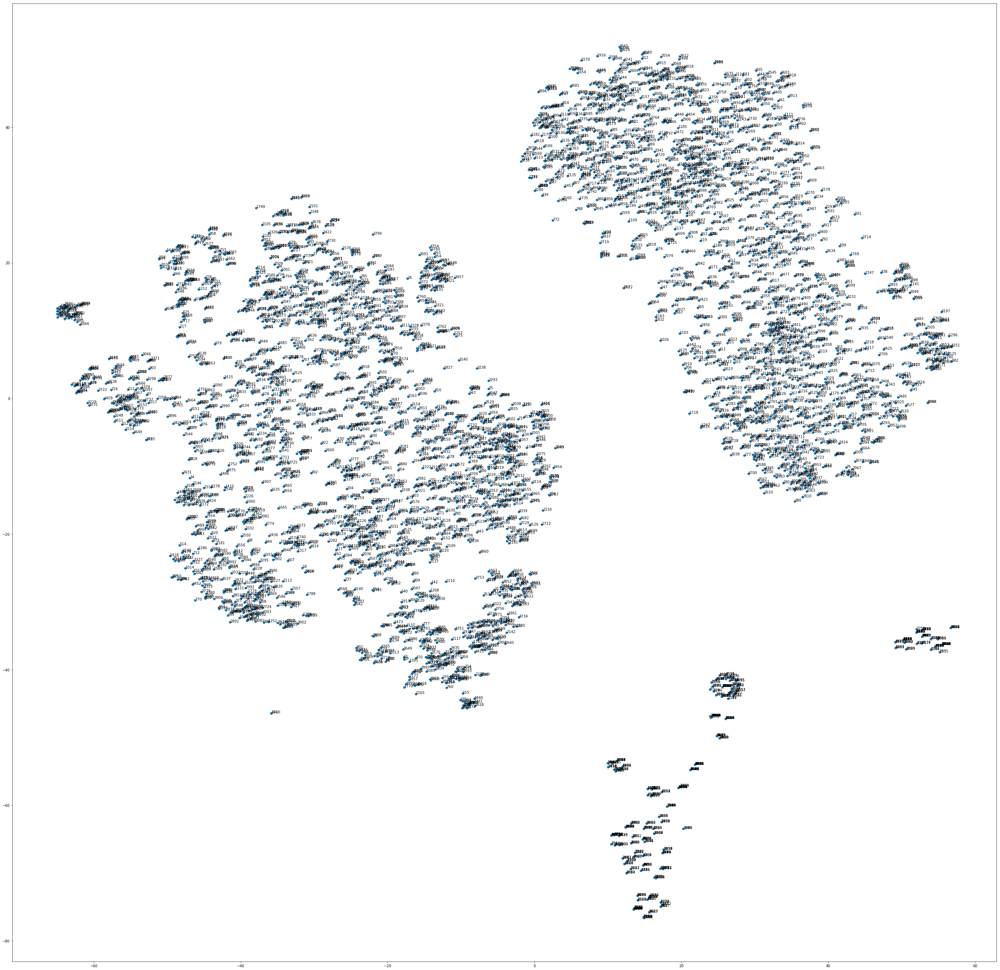

In [104]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [50, 50]
results_df = pd.DataFrame(results)
fig, ax = plt.subplots()
x =  results_df['x']
y = results_df['y']
ax.scatter(x, y)
for i, txt in enumerate(results_df['id'].values):
    ax.annotate(txt, (x[i], y[i]))
plt.savefig('scatter.png')
plt.show()

In [105]:
from sklearn import cluster
Sum_of_squared_distances = []
results_df_k = results_df.drop('id', 1)
K = range(1,15)
for k in K:
    km = cluster.KMeans(n_clusters=k)
    km = km.fit(results_df_k)
    Sum_of_squared_distances.append(km.inertia_)

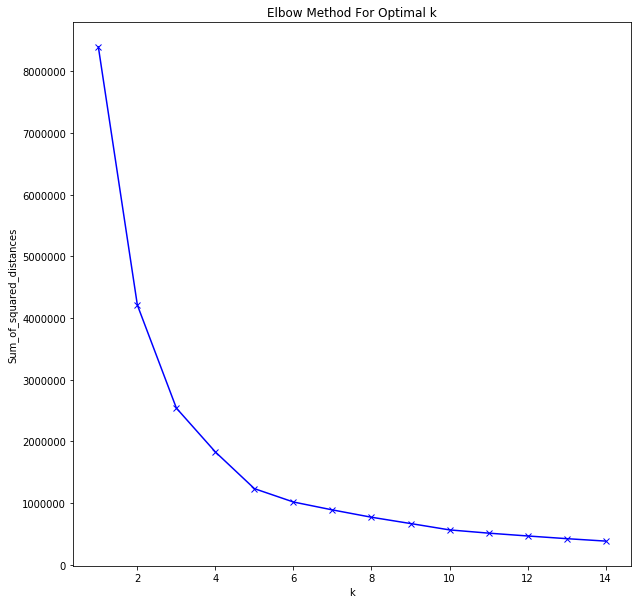

In [106]:
plt.rcParams['figure.figsize'] = [10, 10]
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [107]:
def cluster_images(dataset):
    #we can tell that n= or 5 are the optimal # of clusters
    #from using the elbow method on the graph above
    
    #dataset should be array-like or sparse matrix, shape=(n_samples, n_features)
    k_means = cluster.KMeans(n_clusters=5)
    k_means.fit_predict(dataset)
    clusters_means = k_means.cluster_centers_.squeeze()
    image_clusters = k_means.labels_

    print('# of Observations:', dataset.shape)
    print('Clusters Means:', clusters_means)
    print('labels:', image_clusters)
    return image_clusters

currentDirectory = './'
image_clusters = cluster_images(results_df_k)

# of Observations: (5000, 2)
Clusters Means: [[-18.23926893 -20.70125774]
 [ 36.55842896   4.4138743 ]
 [-35.66757107   7.75146687]
 [ 18.32085561  35.92045891]
 [ 24.97839528 -53.89142398]]
labels: [2 3 2 ... 3 0 4]


In [108]:
'''NEVER FINISHES RUNNING:

#Find the sillhouette score to find optimal number of clusters:
#http://www.awesomestats.in/python-cluster-validation/
from sklearn import cluster
from sklearn.metrics import silhouette_samples, silhouette_score

results_df_k = results_df.drop('id', 1)
cluster_range = range(1,15)
for n in cluster_range:
    clusterer = cluster.SpectralClustering(n_clusters=n, random_state=10)
    cluster_labels = clusterer.fit_predict(results_df_k)
    silhouette_avg = silhouette_score(results_df_k, cluster_labels)
    print("For n = ", n, ". The average silhouette score is : ",
        silhouette_avg)
    sample_silhouette_values = silhouette_samples(results_df_k, cluster_labels)

'''

'NEVER FINISHES RUNNING:\n\n#Find the sillhouette score to find optimal number of clusters:\n#http://www.awesomestats.in/python-cluster-validation/\nfrom sklearn import cluster\nfrom sklearn.metrics import silhouette_samples, silhouette_score\n\nresults_df_k = results_df.drop(\'id\', 1)\ncluster_range = range(1,15)\nfor n in cluster_range:\n    clusterer = cluster.SpectralClustering(n_clusters=n, random_state=10)\n    cluster_labels = clusterer.fit_predict(results_df_k)\n    silhouette_avg = silhouette_score(results_df_k, cluster_labels)\n    print("For n = ", n, ". The average silhouette score is : ",\n        silhouette_avg)\n    sample_silhouette_values = silhouette_samples(results_df_k, cluster_labels)\n\n'

In [109]:
'''def spectral_cluster_images(dataset):
    #Spectral clustering has complexity O(n^3) therefore it is not particularly
    #suited for a dataset of this size...
    
    
    spec_clustering = cluster.SpectralClustering(n_clusters = 5)
    clusterer = spec_clustering.fit_predict(dataset)
    image_clusters = clusterer.labels_
    return image_clusters

image_clusters = spectral_cluster_images(results_df_k)'''

'def spectral_cluster_images(dataset):\n    #Spectral clustering has complexity O(n^3) therefore it is not particularly\n    #suited for a dataset of this size...\n    \n    \n    spec_clustering = cluster.SpectralClustering(n_clusters = 5)\n    clusterer = spec_clustering.fit_predict(dataset)\n    image_clusters = clusterer.labels_\n    return image_clusters\n\nimage_clusters = spectral_cluster_images(results_df_k)'

In [110]:
currentDirectory = os.path.dirname("__file__")
csvPath = os.path.join(currentDirectory, 'attribute_list.csv')
df = pd.read_csv(csvPath)
df['cluster'] = image_clusters
df.to_csv('attribute_list_onehot_w_clusters.csv')

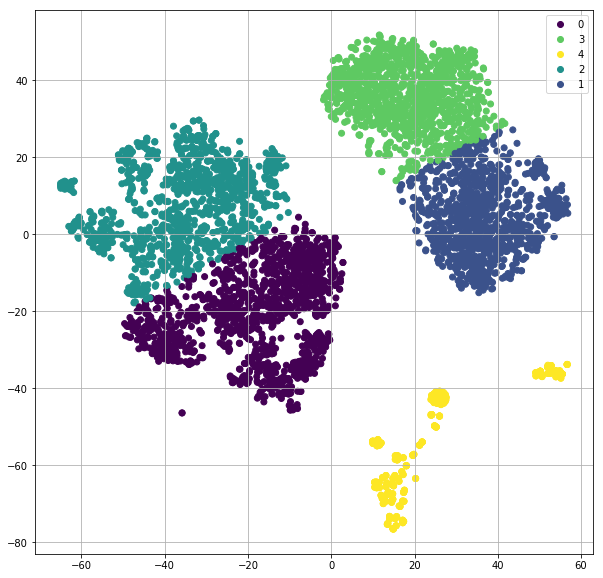

In [111]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 10]
results_df = pd.DataFrame(results)
fig, ax = plt.subplots()
x =  results_df['x']
y = results_df['y']
sc = plt.scatter(x, y, c=image_clusters, alpha=1)
clset = set(zip(image_clusters, image_clusters))
handles = [plt.plot([],color=sc.get_cmap()(sc.norm(c)),ls="", marker="o")[0] for c,l in clset ]
labels = [l for c,l in clset]
plt.legend(handles, labels)

ax.grid(True)
#for i, txt in enumerate(results_df['id'].values):
#    ax.annotate(txt, (x[i], y[i]), rotation=45)
#plt.savefig('scatter.png')
plt.show()

In [112]:
def print_coords(image_number):
    print(results[image_number-1])

print_coords(1890)

{'id': 1890, 'x': -62.603554, 'y': 13.479676}


/home/ilyas/dev/environments/AMLSassignment/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


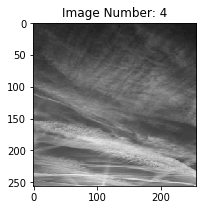

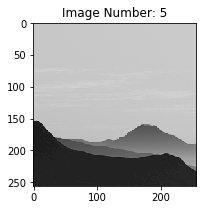

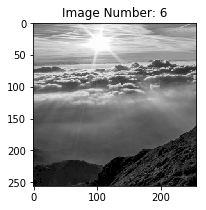

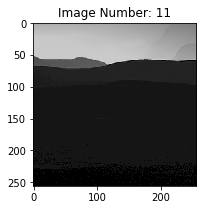

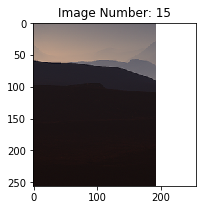

...

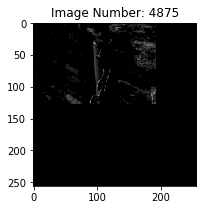

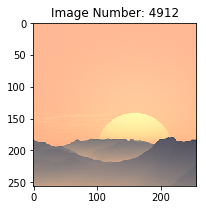

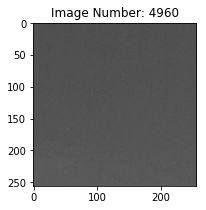

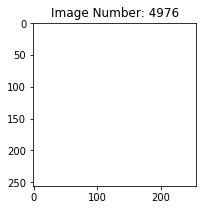

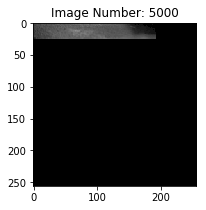

In [98]:
from PIL import Image

def show_images_in_group(image_cluster):
    currentDirectory = os.path.dirname("__file__")
    csvPath = os.path.join(currentDirectory, 'attribute_list.csv')
    imagesPath =  os.path.join(currentDirectory, 'images/')
    for idx, c in enumerate(image_clusters):
        if(c == image_cluster):
            filename = imagesPath+str(idx+1)+'.png'
            image = Image.open(filename)
            plt.rcParams['figure.figsize'] = [3, 3]
            plt.figure()
            plt.title('Image Number: '+ str(idx+1))
            plt.imshow(image)
            #print(idx+1)
            
show_images_in_group(2)

In [114]:
import shutil
import os

def build_filtered_dataset(df, cluster_number, move_filtered=True):
    #df must have a column with cluster labels
    #The rows with the cluster_number provided will be removed.
    imagesToRemoveDf = df.loc[df['cluster'] == cluster_number]
    filteredDf = df.drop(df[df['cluster']==cluster_number].index)
    #moves filtered images to their own directory:
    imagesPath = './images/'
    removedImagesPath = './removed_images/'
    if move_filtered:
        if os.path.isdir(removedImagesPath)==False:
            os.mkdir(removedImagesPath)
        for idx, row in imagesToRemoveDf.iterrows():
            fileName = str(row['file_name'])+'.png'
            filePath = os.path.join(imagesPath, fileName)
            newFilePath = os.path.join(removedImagesPath, fileName)
            shutil.move(filePath, newFilePath)
            print('Moved file ', fileName, ' to ', newFilePath, '.')
        
    return filteredDf

filteredDf = build_filtered_dataset(df, 4)

Moved file  4.png  to  ./removed_images/4.png .
Moved file  5.png  to  ./removed_images/5.png .
Moved file  6.png  to  ./removed_images/6.png .
Moved file  11.png  to  ./removed_images/11.png .
Moved file  15.png  to  ./removed_images/15.png .
Moved file  21.png  to  ./removed_images/21.png .
Moved file  27.png  to  ./removed_images/27.png .
Moved file  58.png  to  ./removed_images/58.png .
Moved file  67.png  to  ./removed_images/67.png .
Moved file  125.png  to  ./removed_images/125.png .
Moved file  129.png  to  ./removed_images/129.png .
Moved file  151.png  to  ./removed_images/151.png .
Moved file  167.png  to  ./removed_images/167.png .
Moved file  175.png  to  ./removed_images/175.png .
Moved file  193.png  to  ./removed_images/193.png .
Moved file  203.png  to  ./removed_images/203.png .
Moved file  207.png  to  ./removed_images/207.png .
Moved file  220.png  to  ./removed_images/220.png .
Moved file  222.png  to  ./removed_images/222.png .
Moved file  227.png  to  ./removed_i

In [118]:
filteredDf = filteredDf.drop('cluster', 1)

KeyError: "['cluster'] not found in axis"

In [123]:
filteredDf.head()

,file_name,hair_color,eyeglasses,smiling,young,human
0,1,1,-1,1,1,-1
1,2,4,-1,1,1,1
2,3,5,-1,1,-1,-1
6,7,2,-1,1,1,-1
7,8,3,-1,1,1,-1


In [124]:
filteredDf.to_csv('attribute_list_filtered.csv', index=False)

In [125]:
len(filteredDf.index)

4565